<a href="https://colab.research.google.com/github/Alexsinator/Challenge_Telecom_X_Parte2/blob/main/TelecomX_LATAM_Parte_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [96]:
import pandas as pd

In [97]:
datos = pd.read_csv('/content/datos_tratados.csv')


# Lectura de los datos

In [98]:
datos

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total,Cuentas_Diarias
0,0002-ORFBO,No,Female,No,Yes,Yes,9,Yes,No,DSL,...,No,Yes,Yes,No,One year,Yes,Mailed check,65.60,593.30,2.186667
1,0003-MKNFE,No,Male,No,No,No,9,Yes,Yes,DSL,...,No,No,No,Yes,Month-to-month,No,Mailed check,59.90,542.40,1.996667
2,0004-TLHLJ,Yes,Male,No,No,No,4,Yes,No,Fiber optic,...,Yes,No,No,No,Month-to-month,Yes,Electronic check,73.90,280.85,2.463333
3,0011-IGKFF,Yes,Male,Si,Yes,No,13,Yes,No,Fiber optic,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,98.00,1237.85,3.266667
4,0013-EXCHZ,Yes,Female,Si,Yes,No,3,Yes,No,Fiber optic,...,No,Yes,Yes,No,Month-to-month,Yes,Mailed check,83.90,267.40,2.796667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,9987-LUTYD,No,Female,No,No,No,13,Yes,No,DSL,...,No,Yes,No,No,One year,No,Mailed check,55.15,742.90,1.838333
7039,9992-RRAMN,Yes,Male,No,Yes,No,22,Yes,Yes,Fiber optic,...,No,No,No,Yes,Month-to-month,Yes,Electronic check,85.10,1873.70,2.836667
7040,9992-UJOEL,No,Male,No,No,No,2,Yes,No,DSL,...,No,No,No,No,Month-to-month,Yes,Mailed check,50.30,92.75,1.676667
7041,9993-LHIEB,No,Male,No,Yes,Yes,67,Yes,No,DSL,...,Yes,Yes,No,Yes,Two year,No,Mailed check,67.85,4627.65,2.261667


In [99]:
datos.shape

(7043, 22)

In [100]:
datos.describe()

,customer.tenure,account.Charges.Monthly,account.Charges.Total,Cuentas_Diarias
count,7043.000000,7043.000000,7032.000000,7043.000000
mean,32.371149,64.761692,2283.300441,2.158723
std,24.559481,30.090047,2266.771362,1.003002
min,0.000000,18.250000,18.800000,0.608333
25%,9.000000,35.500000,401.450000,1.183333
50%,29.000000,70.350000,1397.475000,2.345000
75%,55.000000,89.850000,3794.737500,2.995000
max,72.000000,118.750000,8684.800000,3.958333


In [101]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   customerID                 7043 non-null   object 
 1   Churn                      7043 non-null   object 
 2   customer.gender            7043 non-null   object 
 3   customer.SeniorCitizen     7043 non-null   object 
 4   customer.Partner           7043 non-null   object 
 5   customer.Dependents        7043 non-null   object 
 6   customer.tenure            7043 non-null   int64  
 7   phone.PhoneService         7043 non-null   object 
 8   phone.MultipleLines        7043 non-null   object 
 9   internet.InternetService   7043 non-null   object 
 10  internet.OnlineSecurity    7043 non-null   object 
 11  internet.OnlineBackup      7043 non-null   object 
 12  internet.DeviceProtection  7043 non-null   object 
 13  internet.TechSupport       7043 non-null   objec

## Análisis de los datos


In [102]:
datos['phone.MultipleLines'].value_counts()

,count
phone.MultipleLines,
No,3390
Yes,2971
No phone service,682


In [103]:
datos['internet.InternetService'].value_counts()

,count
internet.InternetService,
Fiber optic,3096
DSL,2421
No,1526


In [104]:
datos['internet.OnlineSecurity'].value_counts()

,count
internet.OnlineSecurity,
No,3498
Yes,2019
No internet service,1526


In [105]:
datos['internet.OnlineBackup'].value_counts()

,count
internet.OnlineBackup,
No,3088
Yes,2429
No internet service,1526


In [106]:
datos['internet.DeviceProtection'].value_counts()

,count
internet.DeviceProtection,
No,3095
Yes,2422
No internet service,1526


In [107]:
datos['internet.DeviceProtection'].value_counts()

,count
internet.DeviceProtection,
No,3095
Yes,2422
No internet service,1526


In [108]:
datos['internet.TechSupport'].value_counts()

,count
internet.TechSupport,
No,3473
Yes,2044
No internet service,1526


In [109]:
datos['internet.TechSupport'].value_counts()

,count
internet.TechSupport,
No,3473
Yes,2044
No internet service,1526


In [110]:
datos['internet.StreamingTV'].value_counts()

,count
internet.StreamingTV,
No,2810
Yes,2707
No internet service,1526


In [111]:
datos['internet.StreamingMovies'].value_counts()

,count
internet.StreamingMovies,
No,2785
Yes,2732
No internet service,1526


### Revisión de consistencia de datos

In [112]:
columnas_a_verificar = ['internet.OnlineSecurity', 'internet.OnlineBackup', 'internet.DeviceProtection', 'internet.TechSupport', 'internet.StreamingTV', 'internet.StreamingMovies']
columna_referencia = 'internet.InternetService'

In [113]:
for columna in columnas_a_verificar:
    inconsistencias = (datos[columna_referencia] == 'Yes') & (datos[columna] == 'No internet service')
    if inconsistencias.any():
        print(f"Inconsistencias encontradas en la columna:  {columna}.")
    else:
        print(f"No se encontraron inconsistencias en la columna {columna}.")

No se encontraron inconsistencias en la columna internet.OnlineSecurity.
No se encontraron inconsistencias en la columna internet.OnlineBackup.
No se encontraron inconsistencias en la columna internet.DeviceProtection.
No se encontraron inconsistencias en la columna internet.TechSupport.
No se encontraron inconsistencias en la columna internet.StreamingTV.
No se encontraron inconsistencias en la columna internet.StreamingMovies.


##Tratamiento de los datos

In [114]:
datos.tail(10)

,customerID,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,...,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total,Cuentas_Diarias
7033,9975-SKRNR,No,Male,No,No,No,1,Yes,No,No,...,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Mailed check,18.90,18.90,0.630000
7034,9978-HYCIN,No,Male,Si,Yes,Yes,47,Yes,No,Fiber optic,...,No,No,Yes,No,One year,Yes,Bank transfer (automatic),84.95,4018.05,2.831667
7035,9979-RGMZT,No,Female,No,No,No,7,Yes,No,Fiber optic,...,No,No,Yes,Yes,One year,Yes,Mailed check,94.05,633.45,3.135000
7036,9985-MWVIX,Yes,Female,No,No,No,1,Yes,No,Fiber optic,...,No,No,No,No,Month-to-month,Yes,Mailed check,70.15,70.15,2.338333
7037,9986-BONCE,Yes,Female,No,No,No,4,Yes,No,No,...,No internet service,No internet service,No internet service,No internet service,Month-to-month,No,Bank transfer (automatic),20.95,85.50,0.698333
7038,9987-LUTYD,No,Female,No,No,No,13,Yes,No,DSL,...,No,Yes,No,No,One year,No,Mailed check,55.15,742.90,1.838333
7039,9992-RRAMN,Yes,Male,No,Yes,No,22,Yes,Yes,Fiber optic,...,No,No,No,Yes,Month-to-month,Yes,Electronic check,85.10,1873.70,2.836667
7040,9992-UJOEL,No,Male,No,No,No,2,Yes,No,DSL,...,No,No,No,No,Month-to-month,Yes,Mailed check,50.30,92.75,1.676667
7041,9993-LHIEB,No,Male,No,Yes,Yes,67,Yes,No,DSL,...,Yes,Yes,No,Yes,Two year,No,Mailed check,67.85,4627.65,2.261667
7042,9995-HOTOH,No,Male,No,Yes,Yes,63,No,No phone service,DSL,...,Yes,No,Yes,Yes,Two year,No,Electronic check,59.00,3707.60,1.966667


In [115]:
datos = datos.drop('customerID', axis = 1)

In [116]:
# Codigo para no mostrar advertencias sobre el codigo
import warnings

warnings.filterwarnings("ignore")

### Codificación de datos

In [117]:
# Reemplazos a binarios
datos['Churn'] = datos['Churn'].replace({'No': 0, 'Yes':1})
datos['customer.gender'] = datos['customer.gender'].replace({'Male': 0, 'Female': 1})
datos['customer.SeniorCitizen'] = datos['customer.SeniorCitizen'].replace({'No': 0, 'Si': 1})
datos['customer.Partner'] = datos['customer.Partner'].replace({'No': 0, 'Yes':1})
datos['customer.Dependents'] = datos['customer.Dependents'].replace({'No': 0, 'Yes':1})
datos['phone.PhoneService'] = datos['phone.PhoneService'].replace({'No': 0, 'Yes':1})
datos['account.PaperlessBilling'] = datos['account.PaperlessBilling'].replace({'No': 0, 'Yes':1})


In [118]:
datos.sample(10)

,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,phone.MultipleLines,internet.InternetService,internet.OnlineSecurity,...,internet.DeviceProtection,internet.TechSupport,internet.StreamingTV,internet.StreamingMovies,account.Contract,account.PaperlessBilling,account.PaymentMethod,account.Charges.Monthly,account.Charges.Total,Cuentas_Diarias
4676,1,0,0,0,0,2,1,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,0,Credit card (automatic),19.30,28.30,0.643333
3032,0,1,0,0,1,24,1,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,0,Mailed check,19.75,498.10,0.658333
4444,0,1,0,0,0,26,1,No,DSL,No,...,Yes,No,No,No,Month-to-month,1,Credit card (automatic),54.75,1406.90,1.825000
2802,0,0,0,0,0,26,1,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,0,Mailed check,19.40,525.55,0.646667
4150,0,0,0,0,1,1,1,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Month-to-month,1,Mailed check,20.25,20.25,0.675000
3677,0,0,0,0,0,9,1,No,DSL,Yes,...,Yes,Yes,Yes,No,Month-to-month,1,Mailed check,69.50,653.25,2.316667
1382,0,0,0,1,0,1,1,No,DSL,Yes,...,Yes,No,No,No,Month-to-month,0,Mailed check,55.70,55.70,1.856667
4723,0,0,0,1,1,67,1,Yes,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,Two year,0,Mailed check,26.30,1688.90,0.876667
4257,0,1,0,1,1,67,1,Yes,DSL,No,...,Yes,Yes,No,Yes,Two year,1,Bank transfer (automatic),69.90,4615.90,2.330000
3804,1,0,0,0,0,2,1,No,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,0,Electronic check,94.95,178.10,3.165000


In [119]:
datos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Churn                      7043 non-null   int64  
 1   customer.gender            7043 non-null   int64  
 2   customer.SeniorCitizen     7043 non-null   int64  
 3   customer.Partner           7043 non-null   int64  
 4   customer.Dependents        7043 non-null   int64  
 5   customer.tenure            7043 non-null   int64  
 6   phone.PhoneService         7043 non-null   int64  
 7   phone.MultipleLines        7043 non-null   object 
 8   internet.InternetService   7043 non-null   object 
 9   internet.OnlineSecurity    7043 non-null   object 
 10  internet.OnlineBackup      7043 non-null   object 
 11  internet.DeviceProtection  7043 non-null   object 
 12  internet.TechSupport       7043 non-null   object 
 13  internet.StreamingTV       7043 non-null   objec

In [120]:
# Hacer categoricas a númericas
categoricas = ['account.PaymentMethod', 'phone.MultipleLines', 'internet.InternetService', 'internet.OnlineSecurity',
               'internet.OnlineBackup', 'internet.DeviceProtection', 'internet.TechSupport', 'internet.StreamingTV',
               'internet.StreamingMovies', 'account.Contract']

In [121]:
datos_codificados = pd.get_dummies(datos, columns=categoricas, dtype = int)

In [122]:
datos_codificados.sample(10)

,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,account.PaperlessBilling,account.Charges.Monthly,account.Charges.Total,...,internet.TechSupport_Yes,internet.StreamingTV_No,internet.StreamingTV_No internet service,internet.StreamingTV_Yes,internet.StreamingMovies_No,internet.StreamingMovies_No internet service,internet.StreamingMovies_Yes,account.Contract_Month-to-month,account.Contract_One year,account.Contract_Two year
1804,1,1,1,0,0,1,1,1,69.60,69.60,...,0,1,0,0,1,0,0,1,0,0
5204,1,1,0,0,0,11,1,0,90.15,987.95,...,1,0,0,1,1,0,0,1,0,0
4042,0,1,1,1,1,28,0,1,35.90,973.65,...,0,0,0,1,1,0,0,1,0,0
5729,0,0,1,0,0,65,1,1,99.10,6496.15,...,0,0,0,1,0,0,1,1,0,0
2717,0,0,1,1,0,69,1,1,84.90,5785.65,...,0,1,0,0,1,0,0,1,0,0
6996,0,1,0,0,0,12,0,0,49.85,552.10,...,1,1,0,0,0,0,1,0,0,1
6300,0,0,1,1,0,34,1,0,71.55,2427.35,...,0,1,0,0,1,0,0,1,0,0
5403,1,0,0,0,0,12,1,1,84.45,1059.55,...,0,0,0,1,1,0,0,1,0,0
4531,0,1,1,1,0,39,1,0,99.10,3877.95,...,0,0,0,1,0,0,1,0,1,0
5256,0,1,0,0,0,3,1,0,57.55,161.45,...,0,0,0,1,1,0,0,1,0,0


In [123]:
datos_codificados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 42 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Churn                                            7043 non-null   int64  
 1   customer.gender                                  7043 non-null   int64  
 2   customer.SeniorCitizen                           7043 non-null   int64  
 3   customer.Partner                                 7043 non-null   int64  
 4   customer.Dependents                              7043 non-null   int64  
 5   customer.tenure                                  7043 non-null   int64  
 6   phone.PhoneService                               7043 non-null   int64  
 7   account.PaperlessBilling                         7043 non-null   int64  
 8   account.Charges.Monthly                          7043 non-null   float64
 9   account.Charges.Total         

In [124]:
datos['Churn'].value_counts(normalize = True) * 100

,proportion
Churn,
0,73.463013
1,26.536987


In [125]:
df = datos_codificados
df.sample(10)

,Churn,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,account.PaperlessBilling,account.Charges.Monthly,account.Charges.Total,...,internet.TechSupport_Yes,internet.StreamingTV_No,internet.StreamingTV_No internet service,internet.StreamingTV_Yes,internet.StreamingMovies_No,internet.StreamingMovies_No internet service,internet.StreamingMovies_Yes,account.Contract_Month-to-month,account.Contract_One year,account.Contract_Two year
6571,0,0,0,1,0,23,1,0,19.30,486.20,...,0,0,1,0,0,1,0,0,1,0
1696,1,0,1,1,0,40,1,0,101.85,4086.30,...,0,0,0,1,0,0,1,1,0,0
193,0,1,0,0,0,11,0,1,40.40,422.60,...,1,1,0,0,1,0,0,0,1,0
5833,0,0,0,1,0,70,1,0,77.30,5498.20,...,1,1,0,0,0,0,1,0,0,1
137,0,0,1,1,0,63,0,0,36.10,2298.90,...,1,1,0,0,1,0,0,0,1,0
6674,1,1,1,0,0,42,1,1,84.65,3541.35,...,0,0,0,1,1,0,0,1,0,0
6174,1,0,0,0,0,1,1,1,78.95,78.95,...,0,0,0,1,1,0,0,1,0,0
5261,1,0,0,1,0,18,1,1,49.55,878.35,...,0,1,0,0,1,0,0,1,0,0
6236,1,0,0,1,1,32,1,1,99.55,3204.65,...,0,0,0,1,0,0,1,1,0,0
230,0,1,1,0,0,56,1,1,99.90,5706.30,...,1,0,0,1,1,0,0,0,0,1


In [126]:
df.isna().sum().sort_values(ascending = False)

,0
account.Charges.Total,11
Churn,0
customer.gender,0
customer.SeniorCitizen,0
customer.Dependents,0
customer.Partner,0
customer.tenure,0
phone.PhoneService,0
account.PaperlessBilling,0
account.Charges.Monthly,0


In [127]:
df = df.dropna(subset=['account.Charges.Total'])

### Train y Test

In [128]:
from sklearn.model_selection import train_test_split

X = df.drop(['Churn'], axis =1)
y = df['Churn']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=50)

In [129]:
print('Conteo de clases en y_train')
print(y_train.value_counts())

print('\nProporción de clases en y_train')
print(y_train.value_counts(normalize= True))

Conteo de clases en y_train
Churn
0    4143
1    1482
Name: count, dtype: int64

Proporción de clases en y_train
Churn
0    0.736533
1    0.263467
Name: proportion, dtype: float64


In [130]:
df.isna().sum().sort_values(ascending = False)

,0
Churn,0
customer.gender,0
customer.SeniorCitizen,0
customer.Partner,0
customer.Dependents,0
customer.tenure,0
phone.PhoneService,0
account.PaperlessBilling,0
account.Charges.Monthly,0
account.Charges.Total,0


In [131]:
df.shape

(7032, 42)

In [132]:
df.max()

,0
Churn,1.000000
customer.gender,1.000000
customer.SeniorCitizen,1.000000
customer.Partner,1.000000
customer.Dependents,1.000000
customer.tenure,72.000000
phone.PhoneService,1.000000
account.PaperlessBilling,1.000000
account.Charges.Monthly,118.750000
account.Charges.Total,8684.800000


### Escalado de valores

In [133]:
columnas_valores_altos = ['customer.tenure', 'account.Charges.Monthly', 'account.Charges.Total', 'Cuentas_Diarias']

In [134]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_escalado = scaler.fit_transform(X_train[columnas_valores_altos])

X_test_escalado = scaler.transform(X_test[columnas_valores_altos])

In [135]:
X_train_scaled = X_train.copy()
X_test_scaled = X_test.copy()

X_train_scaled.loc[:,columnas_valores_altos] = X_train_escalado
X_test_scaled.loc[:,columnas_valores_altos] = X_test_escalado

# Correlación y Selección de variables.

In [136]:
correlacion = X_train_scaled.corr()
correlacion

,customer.gender,customer.SeniorCitizen,customer.Partner,customer.Dependents,customer.tenure,phone.PhoneService,account.PaperlessBilling,account.Charges.Monthly,account.Charges.Total,Cuentas_Diarias,...,internet.TechSupport_Yes,internet.StreamingTV_No,internet.StreamingTV_No internet service,internet.StreamingTV_Yes,internet.StreamingMovies_No,internet.StreamingMovies_No internet service,internet.StreamingMovies_Yes,account.Contract_Month-to-month,account.Contract_One year,account.Contract_Two year
customer.gender,1.000000,-0.000958,0.001021,-0.010875,-0.002146,0.012702,0.001922,0.013733,0.003956,0.013733,...,-0.000904,-0.003547,0.000891,0.002820,-0.006161,0.000891,0.005426,0.001665,-0.006498,0.004279
customer.SeniorCitizen,-0.000958,1.000000,0.004766,-0.209849,0.013238,0.003107,0.155588,0.216333,0.098768,0.216333,...,-0.061693,0.051772,-0.186422,0.103790,0.048664,-0.186422,0.106799,0.133940,-0.039702,-0.118312
customer.Partner,0.001021,0.004766,1.000000,0.450822,0.378942,0.025120,-0.018379,0.092180,0.316553,0.092180,...,0.127016,-0.130998,0.005980,0.126657,-0.127471,0.005980,0.122662,-0.291095,0.091005,0.252612
customer.Dependents,-0.010875,-0.209849,0.450822,1.000000,0.170993,-0.000766,-0.111724,-0.117433,0.068813,-0.117433,...,0.077071,-0.099744,0.142604,-0.018952,-0.091263,0.142604,-0.027583,-0.240375,0.071635,0.211961
customer.tenure,-0.002146,0.013238,0.378942,0.170993,1.000000,0.013832,0.005831,0.257961,0.831750,0.257961,...,0.332025,-0.256492,-0.046471,0.296623,-0.263344,-0.046471,0.302486,-0.649756,0.203341,0.563659
phone.PhoneService,0.012702,0.003107,0.025120,-0.000766,0.013832,1.000000,0.020762,0.253669,0.118371,0.253669,...,-0.088919,-0.122038,0.166964,-0.016907,-0.117509,0.166964,-0.021623,-0.008214,0.003821,0.005927
account.PaperlessBilling,0.001922,0.155588,-0.018379,-0.111724,0.005831,0.020762,1.000000,0.358417,0.158632,0.358417,...,0.032628,0.040873,-0.320536,0.226844,0.056117,-0.320536,0.211226,0.168977,-0.052664,-0.146795
account.Charges.Monthly,0.013733,0.216333,0.092180,-0.117433,0.257961,0.253669,0.358417,1.000000,0.653208,1.000000,...,0.337533,0.003783,-0.760503,0.631870,0.005569,-0.760503,0.628909,0.044699,0.010170,-0.061912
account.Charges.Total,0.003956,0.098768,0.316553,0.068813,0.831750,0.118371,0.158632,0.653208,1.000000,0.653208,...,0.435750,-0.212925,-0.374112,0.526699,-0.219449,-0.374112,0.531879,-0.456398,0.175135,0.364986
Cuentas_Diarias,0.013733,0.216333,0.092180,-0.117433,0.257961,0.253669,0.358417,1.000000,0.653208,1.000000,...,0.337533,0.003783,-0.760503,0.631870,0.005569,-0.760503,0.628909,0.044699,0.010170,-0.061912


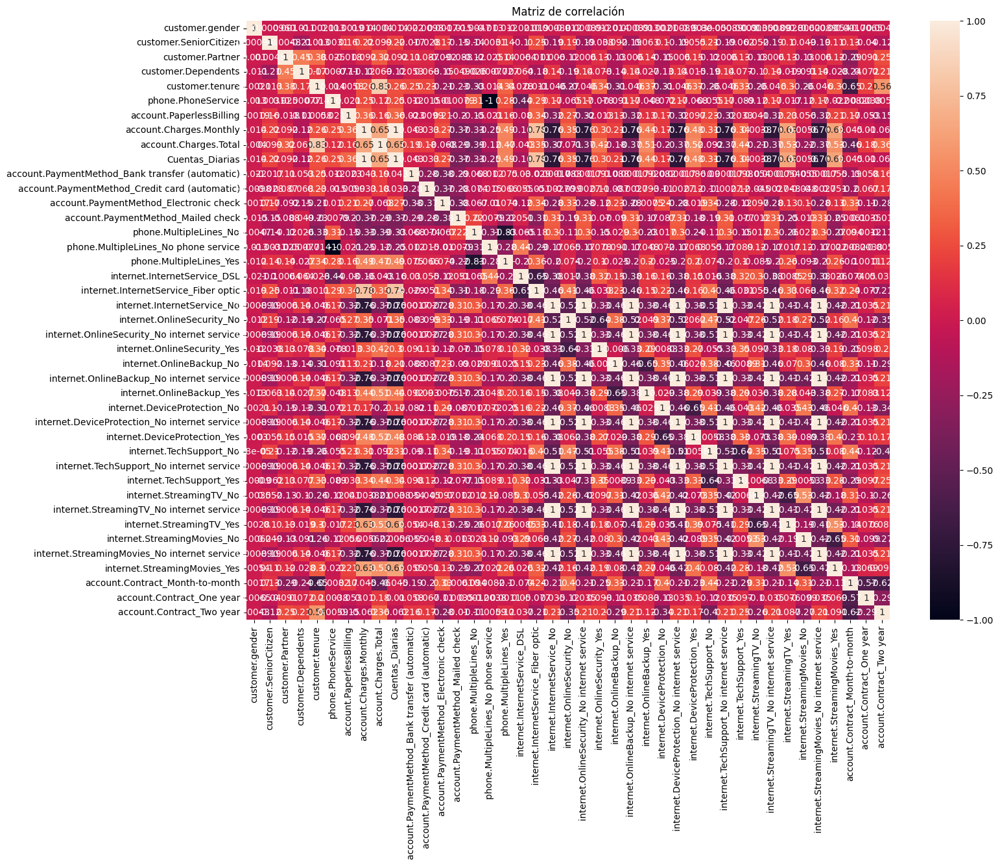

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(16,12))
sns.heatmap(correlacion, annot=True)
plt.title('Matriz de correlación')

plt.savefig('matriz_correlacion.png', dpi=300, bbox_inches='tight')
plt.show()

In [137]:
df_corr = X_train_scaled.copy()
df_corr['Churn'] = y_train.values

correlacion_churn = df_corr.corr()['Churn'].sort_values(ascending = False)
correlacion_churn

,Churn
Churn,1.000000
account.Contract_Month-to-month,0.402028
internet.TechSupport_No,0.329147
internet.OnlineSecurity_No,0.328019
internet.InternetService_Fiber optic,0.301770
account.PaymentMethod_Electronic check,0.295339
internet.OnlineBackup_No,0.263174
internet.DeviceProtection_No,0.253421
account.PaperlessBilling,0.185687
account.Charges.Monthly,0.181827


### Análisis dirigido

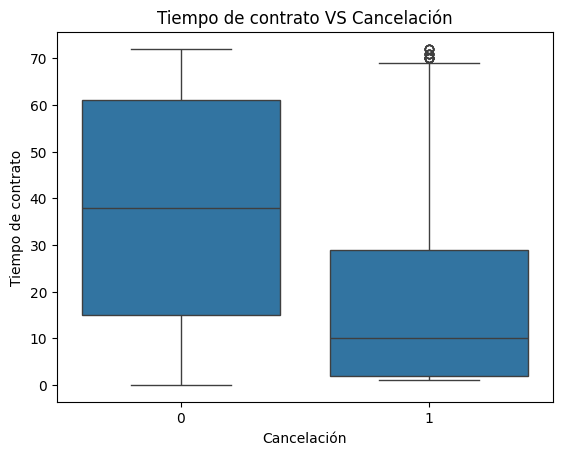

In [138]:
# Tiempo de contrato × Cancelación
# Gasto total × Cancelación

sns.boxplot(data = datos, x='Churn', y = 'customer.tenure')
plt.title('Boxplot')
plt.title('Tiempo de contrato VS Cancelación')
plt.xlabel('Cancelación')
plt.ylabel('Tiempo de contrato')

plt.savefig('boxplot_churn_VS_tiempo.png', dpi=300, bbox_inches='tight')
plt.show()

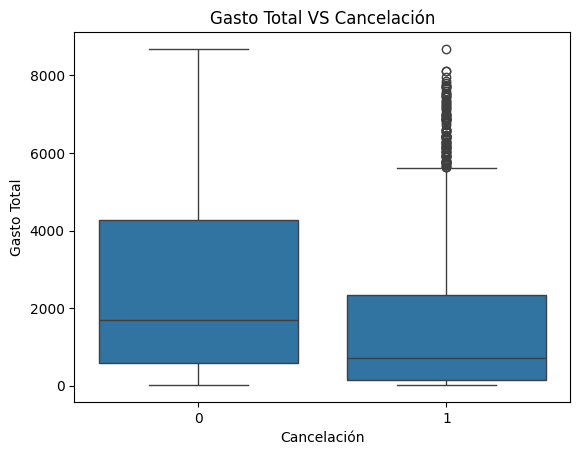

In [139]:
sns.boxplot(data = datos, x='Churn', y = 'account.Charges.Total')
plt.title('Boxplot')
plt.title('Gasto Total VS Cancelación')
plt.xlabel('Cancelación')
plt.ylabel('Gasto Total')

plt.savefig('boxplot_churn_VS_gasto.png', dpi=300, bbox_inches='tight')
plt.show()

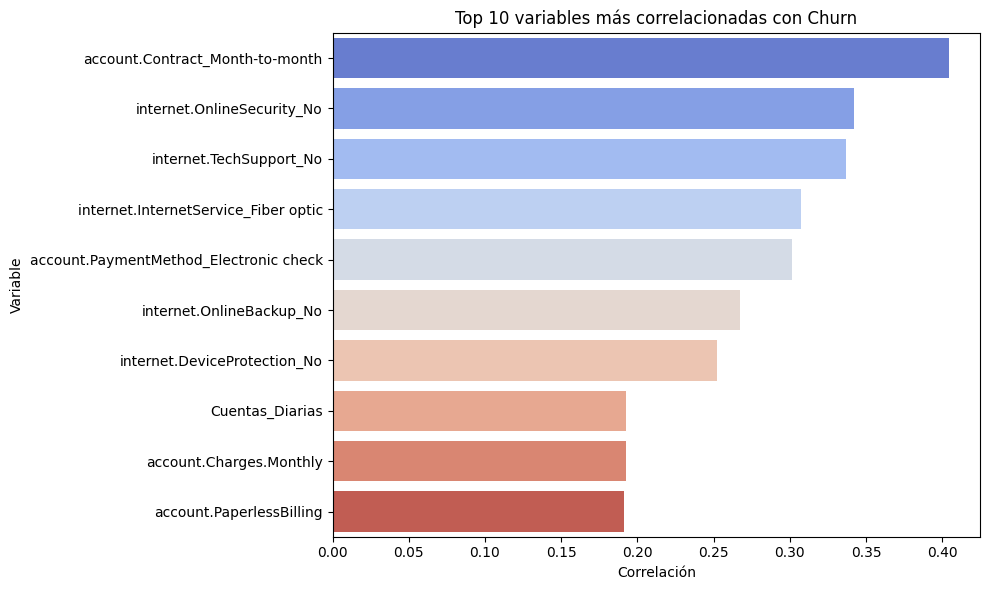

In [140]:
correlaciones = df.corr(numeric_only=True)['Churn'].sort_values(ascending=False)

# Seleccionamos las top 10 (excluyendo Churn=1.0 en sí)
correlaciones_top = correlaciones[1:11]

# Graficamos
plt.figure(figsize=(10, 6))
sns.barplot(x=correlaciones_top.values, y=correlaciones_top.index, palette='coolwarm')
plt.title('Top 10 variables más correlacionadas con Churn')
plt.xlabel('Correlación')
plt.ylabel('Variable')
plt.grid(False)
plt.tight_layout()
plt.savefig('top_10_correlaciones.png', dpi=300, bbox_inches='tight')
plt.show()

### SMOTE

In [141]:
from imblearn.over_sampling import SMOTE
from collections import Counter

Counter((y_train))

Counter({0: 4143, 1: 1482})

In [142]:
smote = SMOTE (random_state=50)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

Counter((y_train_smote))

Counter({0: 4143, 1: 4143})

# Modelos

###Dummy

In [143]:
from sklearn.dummy import DummyClassifier
from sklearn.metrics import classification_report

modelo_dummy = DummyClassifier(random_state=50)
modelo_dummy.fit(X_train, y_train)
y_pred_dummy = modelo_dummy.predict(X_test)

In [144]:
print(classification_report(y_test, y_pred_dummy))

              precision    recall  f1-score   support

           0       0.72      1.00      0.84      1020
           1       0.00      0.00      0.00       387

    accuracy                           0.72      1407
   macro avg       0.36      0.50      0.42      1407
weighted avg       0.53      0.72      0.61      1407



### Logistic Regression


In [145]:
from sklearn.linear_model import LogisticRegression

modelo_log = LogisticRegression(max_iter=1000, random_state=50)
modelo_log.fit(X_train_smote, y_train_smote)
y_pred_log = modelo_log.predict(X_test_scaled) # se revisa con el codigo escalado

In [146]:
print(classification_report(y_test, y_pred_log))

              precision    recall  f1-score   support

           0       0.88      0.83      0.86      1020
           1       0.62      0.70      0.66       387

    accuracy                           0.80      1407
   macro avg       0.75      0.77      0.76      1407
weighted avg       0.81      0.80      0.80      1407



### KNeighbors Classifier

In [147]:
from sklearn.neighbors import KNeighborsClassifier

modelo_knn = KNeighborsClassifier()
modelo_knn.fit(X_train_smote, y_train_smote)
y_pred_knn = modelo_knn.predict(X_test_scaled)

In [148]:
print(classification_report(y_test, y_pred_knn))

              precision    recall  f1-score   support

           0       0.85      0.73      0.79      1020
           1       0.48      0.67      0.56       387

    accuracy                           0.71      1407
   macro avg       0.67      0.70      0.67      1407
weighted avg       0.75      0.71      0.73      1407



### Modelo Random Forest Classifier

In [149]:
from sklearn.ensemble import RandomForestClassifier

modelo_rf = RandomForestClassifier(max_depth=5, random_state=50)
modelo_rf.fit(X_train, y_train)
y_pred_rf = modelo_rf.predict(X_test)

In [150]:
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.81      0.94      0.87      1020
           1       0.72      0.41      0.53       387

    accuracy                           0.79      1407
   macro avg       0.76      0.68      0.70      1407
weighted avg       0.78      0.79      0.77      1407



###Modelo Decision Tree Classifier

In [151]:
from sklearn.tree import DecisionTreeClassifier

modelo_tree = DecisionTreeClassifier(random_state=50)
modelo_tree.fit(X_train, y_train)
y_pred_tree = modelo_tree.predict(X_test)

In [152]:
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.81      0.94      0.87      1020
           1       0.72      0.41      0.53       387

    accuracy                           0.79      1407
   macro avg       0.76      0.68      0.70      1407
weighted avg       0.78      0.79      0.77      1407



### Evaluación completa de modelos

In [153]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

def evaluar_modelo(modelo, X_test, y_test, nombre_modelo='Modelo'):
    y_pred = modelo.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)

    print(f'Evaluación de {nombre_modelo}:')
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')

    print(classification_report(y_test, y_pred))

    matriz = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(matriz, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicciones')
    plt.ylabel('Valores reales')
    plt.title(f'Matriz de confusión para {nombre_modelo}')
    plt.savefig(f'matriz_confusion_{nombre_modelo}.png', dpi=300, bbox_inches='tight')
    plt.show()

Evaluación de Dummy:
Accuracy: 0.7249
Precision: 0.0000
Recall: 0.0000
              precision    recall  f1-score   support

           0       0.72      1.00      0.84      1020
           1       0.00      0.00      0.00       387

    accuracy                           0.72      1407
   macro avg       0.36      0.50      0.42      1407
weighted avg       0.53      0.72      0.61      1407



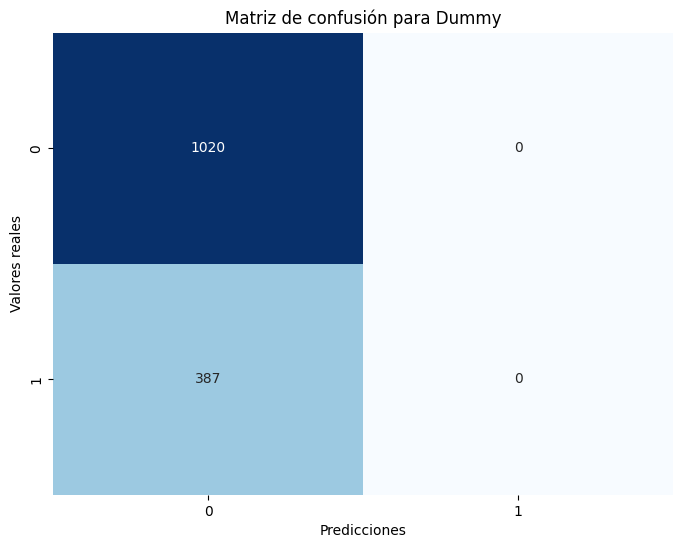

In [154]:
evaluar_modelo(modelo_dummy, X_test, y_test, nombre_modelo='Dummy')

Evaluación de Logistic Regression:
Accuracy: 0.7982
Precision: 0.6168
Recall: 0.7028
              precision    recall  f1-score   support

           0       0.88      0.83      0.86      1020
           1       0.62      0.70      0.66       387

    accuracy                           0.80      1407
   macro avg       0.75      0.77      0.76      1407
weighted avg       0.81      0.80      0.80      1407



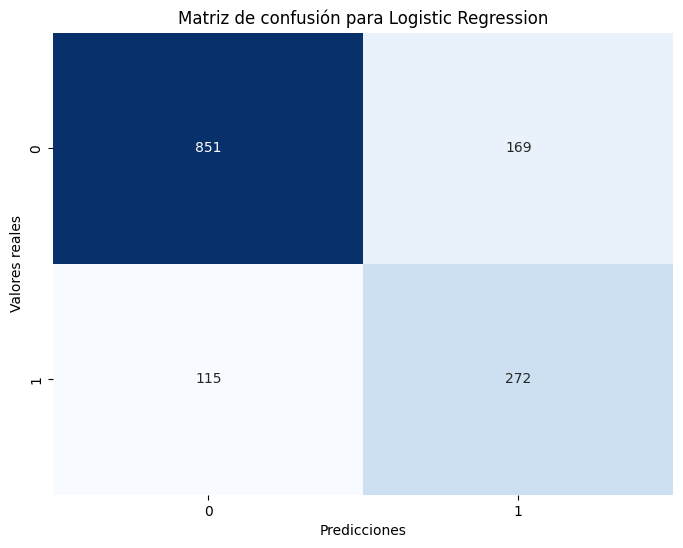

In [155]:
evaluar_modelo(modelo_log, X_test_scaled, y_test, nombre_modelo='Logistic Regression')

Evaluación de KNeighbors Classifier:
Accuracy: 0.7136
Precision: 0.4850
Recall: 0.6667
              precision    recall  f1-score   support

           0       0.85      0.73      0.79      1020
           1       0.48      0.67      0.56       387

    accuracy                           0.71      1407
   macro avg       0.67      0.70      0.67      1407
weighted avg       0.75      0.71      0.73      1407



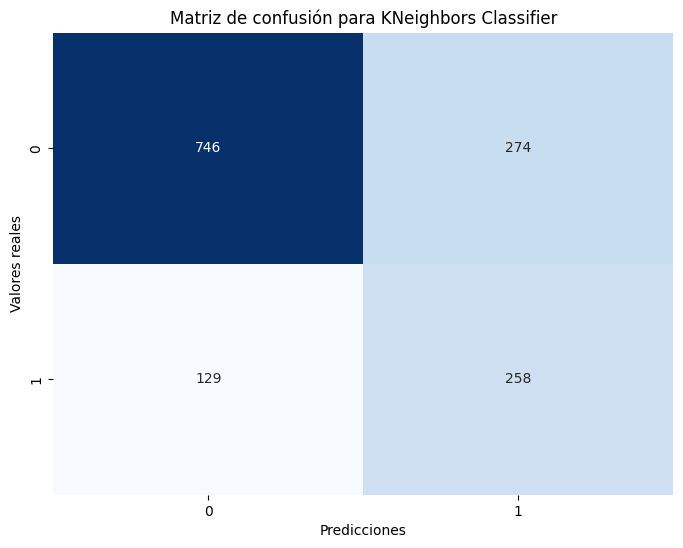

In [156]:
evaluar_modelo(modelo_knn, X_test_scaled, y_test, nombre_modelo='KNeighbors Classifier')

Evaluación de Random Forest Classifier:
Accuracy: 0.7946
Precision: 0.7207
Recall: 0.4134
              precision    recall  f1-score   support

           0       0.81      0.94      0.87      1020
           1       0.72      0.41      0.53       387

    accuracy                           0.79      1407
   macro avg       0.76      0.68      0.70      1407
weighted avg       0.78      0.79      0.77      1407



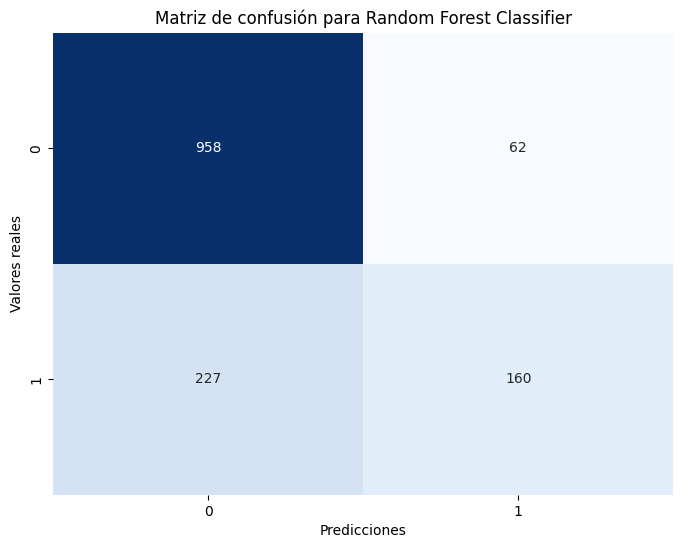

In [157]:
evaluar_modelo(modelo_rf, X_test, y_test, nombre_modelo='Random Forest Classifier')

Evaluación de Decision Tree Classifier:
Accuracy: 0.7321
Precision: 0.5128
Recall: 0.5194
              precision    recall  f1-score   support

           0       0.82      0.81      0.81      1020
           1       0.51      0.52      0.52       387

    accuracy                           0.73      1407
   macro avg       0.66      0.67      0.67      1407
weighted avg       0.73      0.73      0.73      1407



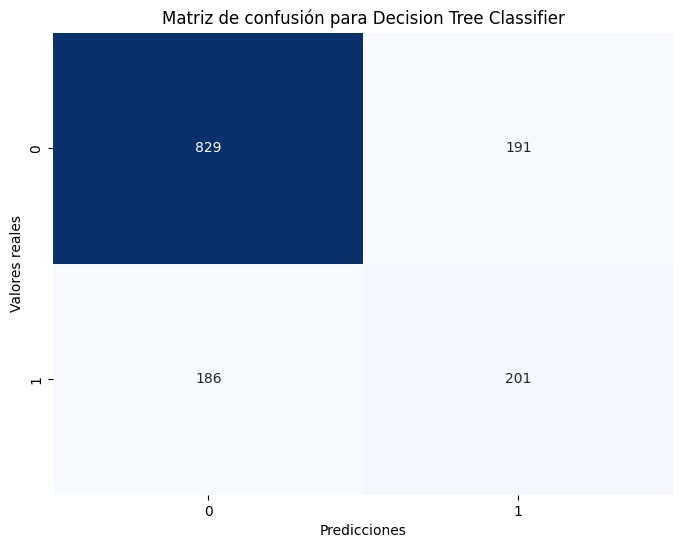

In [158]:
evaluar_modelo(modelo_tree, X_test, y_test, nombre_modelo='Decision Tree Classifier')

### Comparativa de modelos

In [159]:
def obtener_metricas(modelo, X_test, y_test, nombre_modelo):
    y_pred = modelo.predict(X_test)
    return{
        'Modelo': nombre_modelo,
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred),
        'Recall': recall_score(y_test, y_pred),
        'F1 Score': f1_score(y_test, y_pred)
    }

In [160]:
resultados =[]

resultados.append(obtener_metricas(modelo_dummy, X_test, y_test, 'Dummy'))
resultados.append(obtener_metricas(modelo_log, X_test_scaled, y_test, 'Logistic Regression'))
resultados.append(obtener_metricas(modelo_knn, X_test_scaled, y_test, 'KNeighbors Classifier'))
resultados.append(obtener_metricas(modelo_rf, X_test, y_test, 'Random Forest Classifier'))
resultados.append(obtener_metricas(modelo_tree, X_test, y_test, 'Decision Tree Classifier'))

In [161]:
df_resultados = pd.DataFrame(resultados)
df_resultados

,Modelo,Accuracy,Precision,Recall,F1 Score
0,Dummy,0.724947,0.000000,0.000000,0.000000
1,Logistic Regression,0.798152,0.616780,0.702842,0.657005
2,KNeighbors Classifier,0.713575,0.484962,0.666667,0.561480
3,Random Forest Classifier,0.794598,0.720721,0.413437,0.525452
4,Decision Tree Classifier,0.732054,0.512755,0.519380,0.516046


### Modelo XGBosst

In [162]:
from xgboost import XGBClassifier

modelo_xgb = XGBClassifier(random_state=50)
modelo_xgb.fit(X_train, y_train)
y_pred_xgb = modelo_xgb.predict(X_test)

In [163]:
print(classification_report(y_test, y_pred_xgb))

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1020
           1       0.65      0.52      0.58       387

    accuracy                           0.79      1407
   macro avg       0.74      0.71      0.72      1407
weighted avg       0.78      0.79      0.78      1407



Evaluación de XGBoost:
Accuracy: 0.7925
Precision: 0.6537
Recall: 0.5220
              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1020
           1       0.65      0.52      0.58       387

    accuracy                           0.79      1407
   macro avg       0.74      0.71      0.72      1407
weighted avg       0.78      0.79      0.78      1407



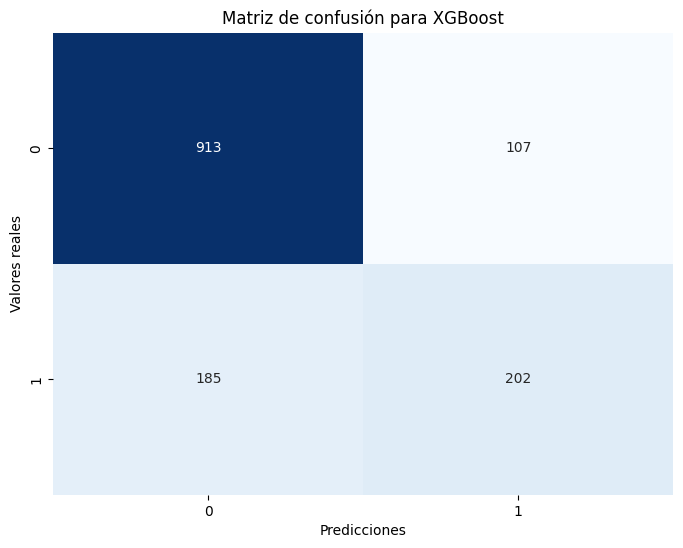

In [164]:
evaluar_modelo(modelo_xgb, X_test, y_test, nombre_modelo='XGBoost')

### Modelo Suport Vector Machine

In [165]:
from sklearn.svm import SVC

modelo_svm = SVC(random_state=50)
modelo_svm.fit(X_train_smote, y_train_smote)
y_pred_svm = modelo_svm.predict(X_test)

In [166]:
print(classification_report(y_test, y_pred_xgb))

              precision    recall  f1-score   support

           0       0.83      0.90      0.86      1020
           1       0.65      0.52      0.58       387

    accuracy                           0.79      1407
   macro avg       0.74      0.71      0.72      1407
weighted avg       0.78      0.79      0.78      1407



Evaluación de Support Vector Machine:
Accuracy: 0.7953
Precision: 0.6159
Recall: 0.6796
              precision    recall  f1-score   support

           0       0.87      0.84      0.86      1020
           1       0.62      0.68      0.65       387

    accuracy                           0.80      1407
   macro avg       0.74      0.76      0.75      1407
weighted avg       0.80      0.80      0.80      1407



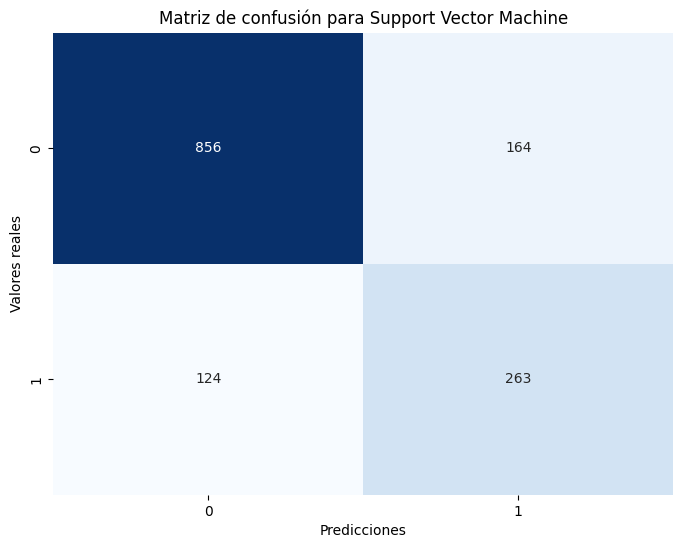

In [167]:
evaluar_modelo(modelo_svm, X_test_scaled, y_test, nombre_modelo='Support Vector Machine')

In [168]:
resultados.append(obtener_metricas(modelo_svm, X_test_scaled, y_test, 'Support Vector Machine'))
resultados.append(obtener_metricas(modelo_xgb, X_test_scaled, y_test, 'XGBoost'))

# Interpretacion y conclusiones

In [169]:
df_resultados = pd.DataFrame(resultados)
df_resultados

,Modelo,Accuracy,Precision,Recall,F1 Score
0,Dummy,0.724947,0.000000,0.000000,0.000000
1,Logistic Regression,0.798152,0.616780,0.702842,0.657005
2,KNeighbors Classifier,0.713575,0.484962,0.666667,0.561480
3,Random Forest Classifier,0.794598,0.720721,0.413437,0.525452
4,Decision Tree Classifier,0.732054,0.512755,0.519380,0.516046
5,Support Vector Machine,0.795309,0.615925,0.679587,0.646192
6,XGBoost,0.751244,0.603352,0.279070,0.381625


In [170]:
import numpy as np
coeficientes = modelo_log.coef_[0]
variables = X_train_scaled.columns

df_coef = pd.DataFrame({'Variable': variables, 'Coeficiente': coeficientes})
df_coef['Importancia Absoluta'] = np.abs(df_coef['Coeficiente'])
df_coef = df_coef.sort_values(by='Importancia Absoluta', ascending=False)

df_coef

,Variable,Coeficiente,Importancia Absoluta
11,account.PaymentMethod_Credit card (automatic),-3.476227,3.476227
10,account.PaymentMethod_Bank transfer (automatic),-3.423479,3.423479
13,account.PaymentMethod_Mailed check,-3.413516,3.413516
40,account.Contract_Two year,-3.402188,3.402188
22,internet.OnlineSecurity_Yes,-3.294972,3.294972
31,internet.TechSupport_Yes,-3.213526,3.213526
14,phone.MultipleLines_No,-2.980616,2.980616
16,phone.MultipleLines_Yes,-2.930190,2.930190
39,account.Contract_One year,-2.914851,2.914851
25,internet.OnlineBackup_Yes,-2.890638,2.890638


In [171]:
from sklearn.inspection import permutation_importance

resultado_permutacion = permutation_importance(modelo_knn, X_test_scaled, y_test, n_repeats=10, random_state=50)
importancia_knn = pd.DataFrame({'Variable': X_test_scaled.columns, 'Importancia': resultado_permutacion.importances_mean})
importancia_knn.sort_values(by='Importancia', ascending=False, inplace=True)

importancia_knn

,Variable,Importancia
39,account.Contract_One year,0.003198
13,account.PaymentMethod_Mailed check,0.003056
32,internet.StreamingTV_No,0.002416
15,phone.MultipleLines_No phone service,0.002345
17,internet.InternetService_DSL,0.002203
18,internet.InternetService_Fiber optic,0.001848
22,internet.OnlineSecurity_Yes,0.001066
8,account.Charges.Total,0.001066
5,phone.PhoneService,0.000569
11,account.PaymentMethod_Credit card (automatic),0.000142


In [172]:
importancia_rf = pd.DataFrame({'Variable': X_train.columns, 'Importancia': modelo_rf.feature_importances_})
importancia_rf = importancia_rf.sort_values(by='Importancia', ascending=False)

importancia_rf

,Variable,Importancia
38,account.Contract_Month-to-month,0.175892
4,customer.tenure,0.135808
8,account.Charges.Total,0.091361
20,internet.OnlineSecurity_No,0.082140
18,internet.InternetService_Fiber optic,0.067387
29,internet.TechSupport_No,0.065492
40,account.Contract_Two year,0.060300
12,account.PaymentMethod_Electronic check,0.051874
9,Cuentas_Diarias,0.037844
7,account.Charges.Monthly,0.037058


In [173]:
importancia_tree = pd.DataFrame({'Variable': X_train.columns, 'Importancia': modelo_tree.feature_importances_})
importancia_tree = importancia_tree.sort_values(by='Importancia', ascending=False)

importancia_tree

,Variable,Importancia
8,account.Charges.Total,0.197512
38,account.Contract_Month-to-month,0.162470
4,customer.tenure,0.114471
7,account.Charges.Monthly,0.101244
9,Cuentas_Diarias,0.098839
18,internet.InternetService_Fiber optic,0.047218
0,customer.gender,0.031119
6,account.PaperlessBilling,0.019586
3,customer.Dependents,0.018799
1,customer.SeniorCitizen,0.018619


In [174]:
importancia_xgb = pd.DataFrame({'Variable': X_train.columns, 'Importancia': modelo_xgb.feature_importances_})
importancia_xgb = importancia_xgb.sort_values(by='Importancia', ascending=False)
importancia_xgb

,Variable,Importancia
18,internet.InternetService_Fiber optic,0.586014
38,account.Contract_Month-to-month,0.209493
29,internet.TechSupport_No,0.013873
17,internet.InternetService_DSL,0.013313
40,account.Contract_Two year,0.011721
37,internet.StreamingMovies_Yes,0.011491
39,account.Contract_One year,0.009425
20,internet.OnlineSecurity_No,0.008659
4,customer.tenure,0.008490
5,phone.PhoneService,0.007730


|index|Modelo|Accuracy|Precision|Recall|F1 Score|
|---|---|---|---|---|---|
|0|Dummy|0\.7249466950959488|0\.0|0\.0|0\.0|
|1|Logistic Regression|0\.7981520966595593|0\.6167800453514739|0\.7028423772609819|0\.6570048309178744|
|2|KNeighbors Classifier|0\.7135749822316987|0\.4849624060150376|0\.6666666666666666|0\.5614798694232862|
|3|Random Forest Classifier|0\.7945984363894811|0\.7207207207207207|0\.4134366925064599|0\.5254515599343186|
|4|Decision Tree Classifier|0\.7320540156361052|0\.5127551020408163|0\.5193798449612403|0\.5160462130937099|
|5|Support Vector Machine|0\.7953091684434968|0\.6159250585480094|0\.6795865633074936|0\.6461916461916462|
|6|XGBoost|0\.7512437810945274|0\.6033519553072626|0\.27906976744186046|0\.38162544169611307|

# **Informe**

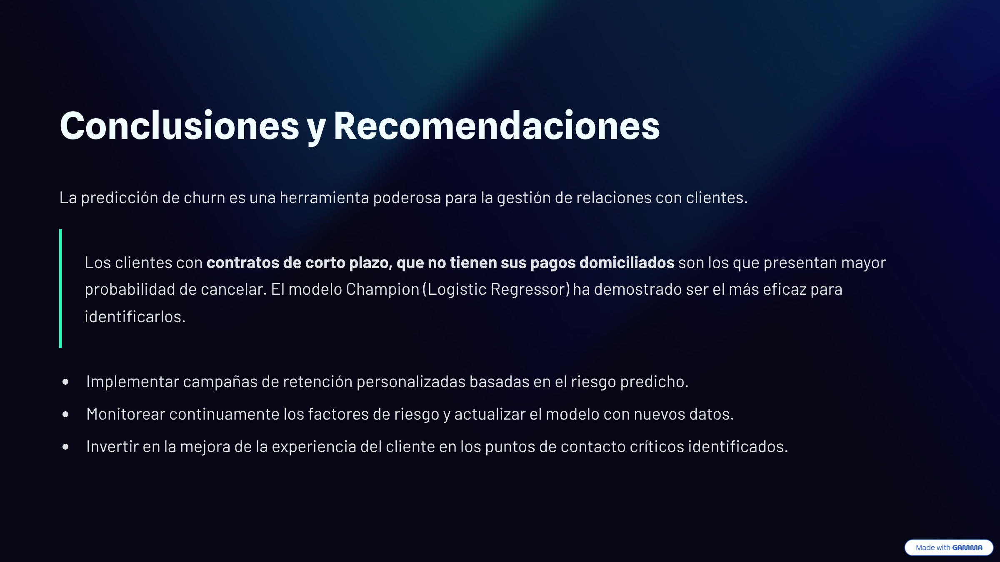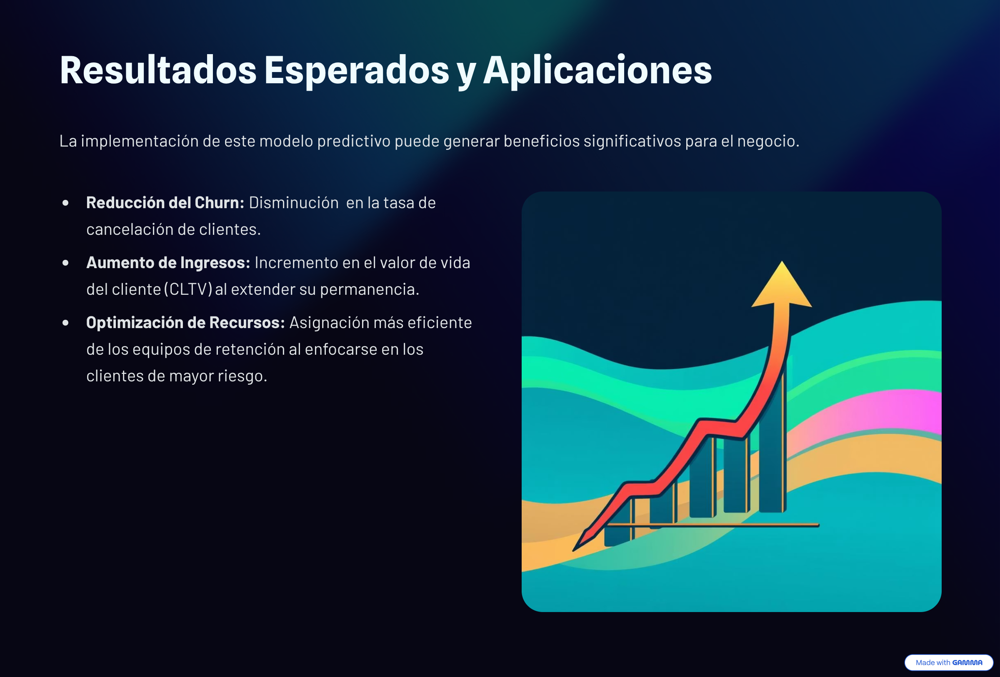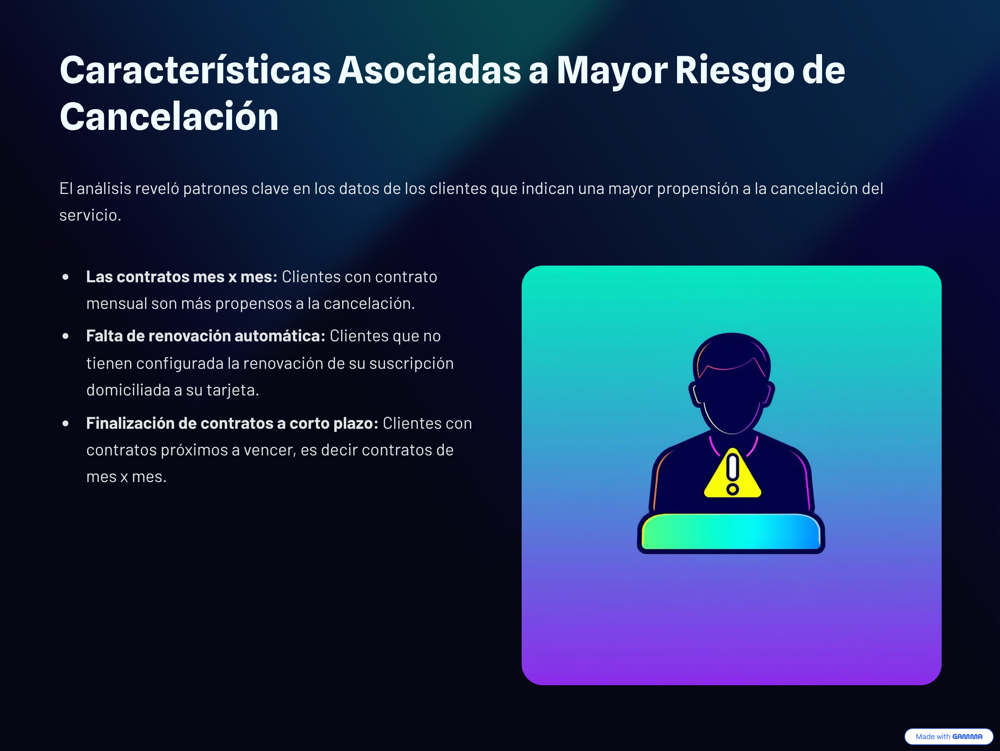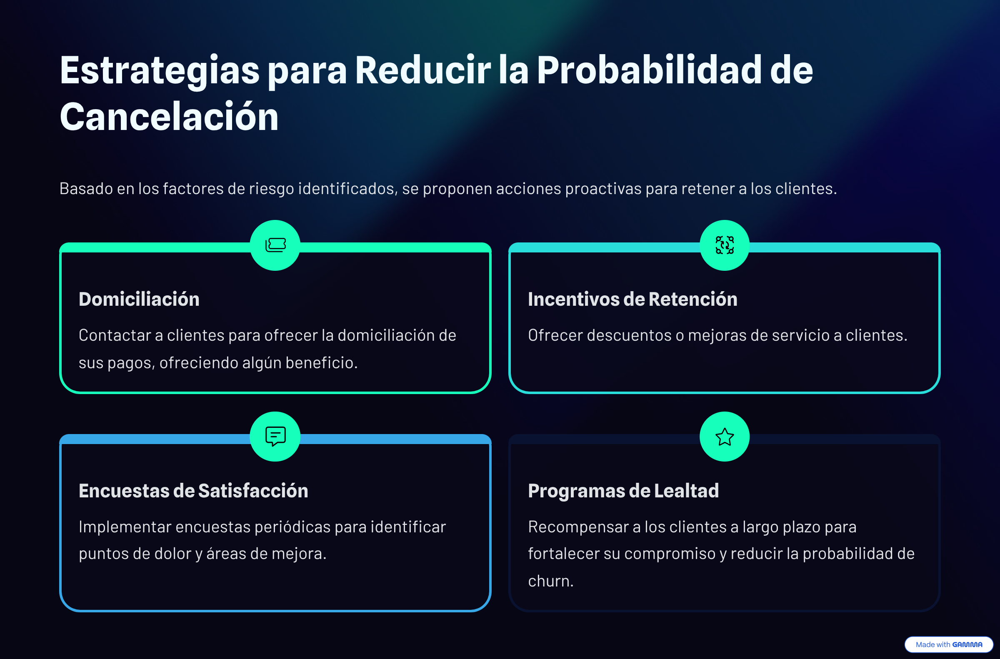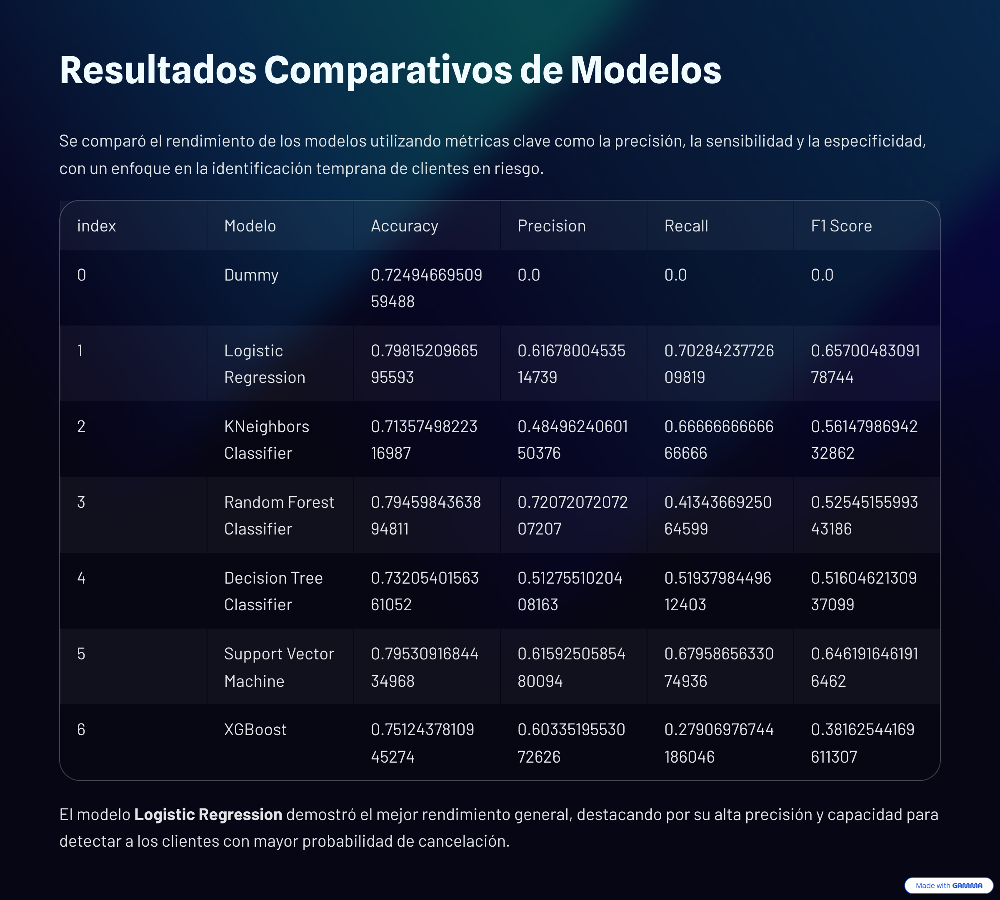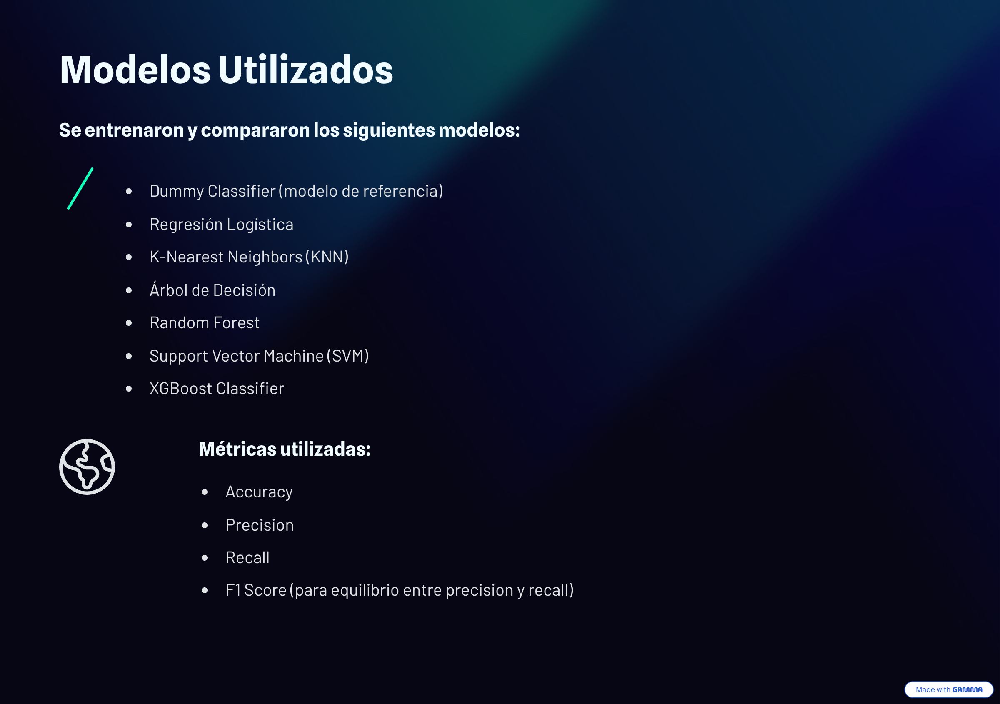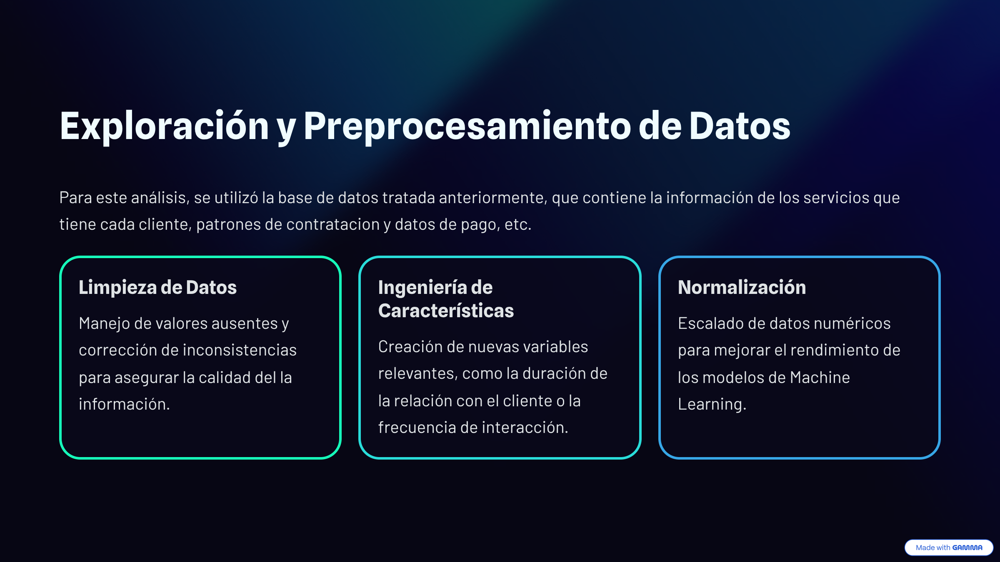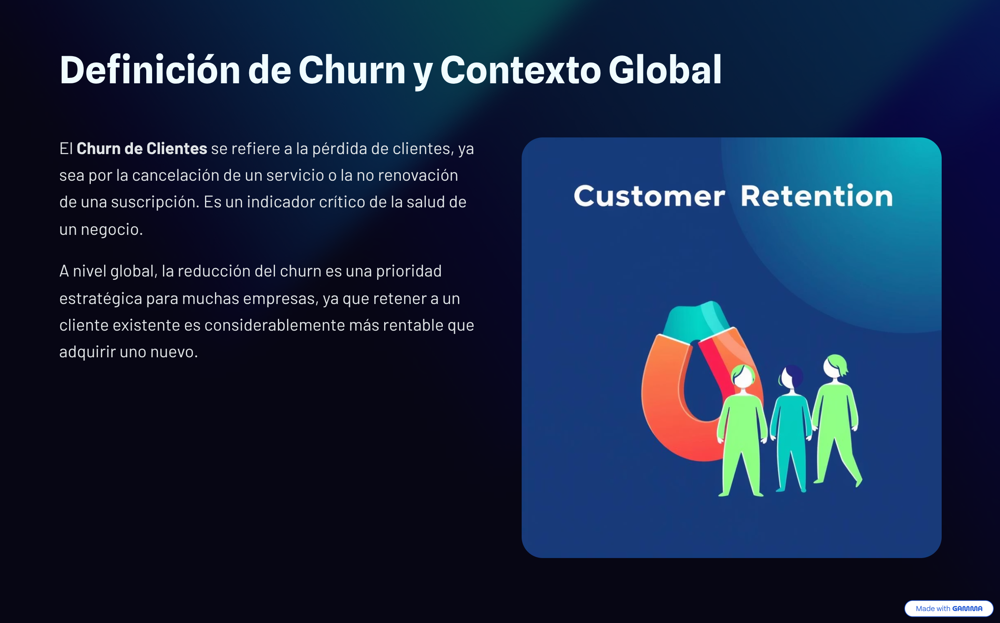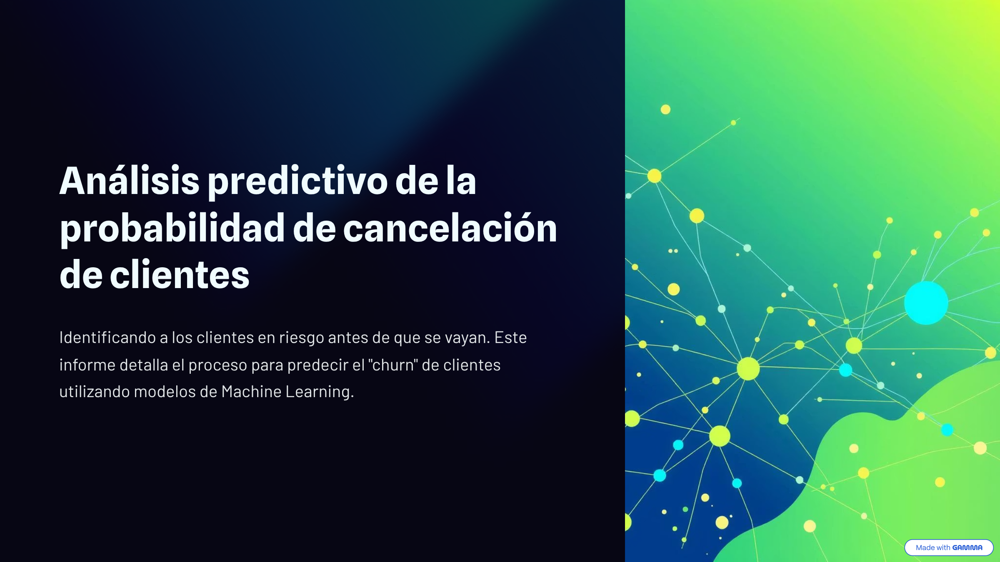